In [1]:
import import_ipynb
import Scanpy_functions_v03262021 as sc_pipe
import scvelo as scv
scv.logging.print_version()
import warnings
import scirpy as ir
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import bbknn
import logging
from sklearn.mixture import GaussianMixture
from scipy.stats     import norm
import glob
import os
import hvplot.pandas
import docx
from docx import Document
from docx.shared import Inches
from docx.shared import Pt
from scipy import sparse
import scanpy.external as sce
import holoviews as hv
import panel as pn
import bokeh
from bokeh.resources import INLINE
import scanorama
import gseapy

importing Jupyter notebook from Scanpy_functions_v03262021.ipynb
Running scvelo 0.2.4 (python 3.9.7) on 2022-07-22 11:06.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


Running scvelo 0.2.4 (python 3.9.7) on 2022-07-22 11:06.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


In [2]:
# define sample metadata. Usually read from a file.
exclude_genes = ['Rpl', 'Rps', 'Trav', 'Traj', 'Trbj', 'Trbv','Mrp','Fau','Dap3','Uba52','Ighv', 'Igkv', 'Iglv']


In_path = '/user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/'

out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/'

In [3]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


In [4]:
adata = sc.read_h5ad(out_path+'/mouse_labeled.h5ad')


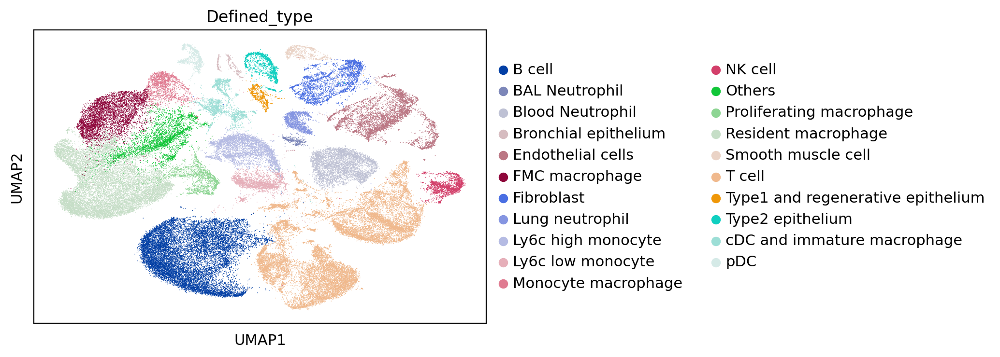

In [5]:
sc.pl.umap(adata, color = 'Defined_type')

In [6]:
adata.obs['Sample'].unique().tolist()

['BLM_BAL_5DE',
 'BLM_Blood_5DE',
 'BLM_Lung_5DE',
 'Elastase_BAL_5DE',
 'Elastase_Lung_5DE',
 'mock_BAL_5DE',
 'mock_Blood_5DE',
 'mock_Lung_5DE']

In [7]:
adata = adata[adata.obs['leiden'].isin(['0','4','8','9','12','14','16','17','20', '30'])]

In [8]:
adata = adata[adata.obs['Sample'].isin(['BLM_BAL_5DE',
 'BLM_Lung_5DE',
 'Elastase_BAL_5DE',
 'Elastase_Lung_5DE',
 'mock_BAL_5DE',
 'mock_Lung_5DE'])]

In [9]:
del adata.uns
adata.uns[ 'log1p']= {}

Filtered out 14869 genes that are detected 20 counts (shared).
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


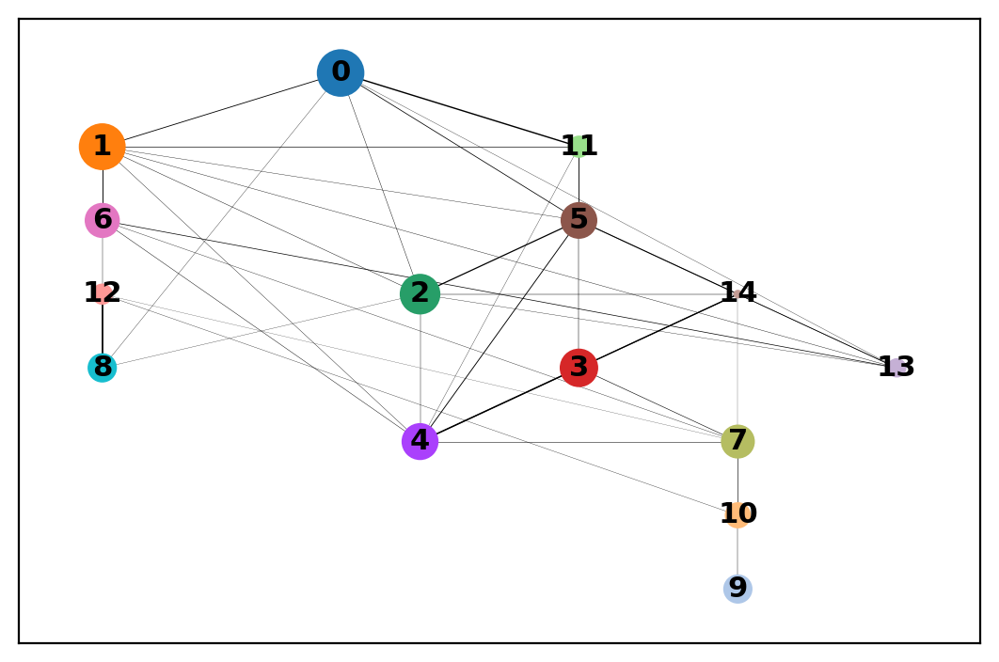

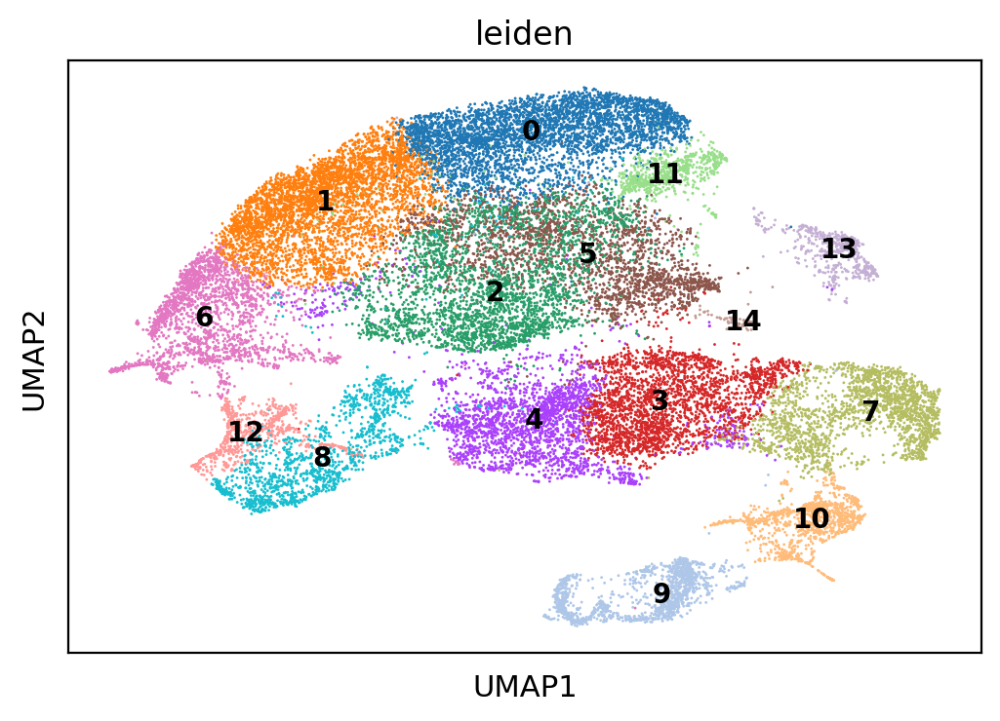

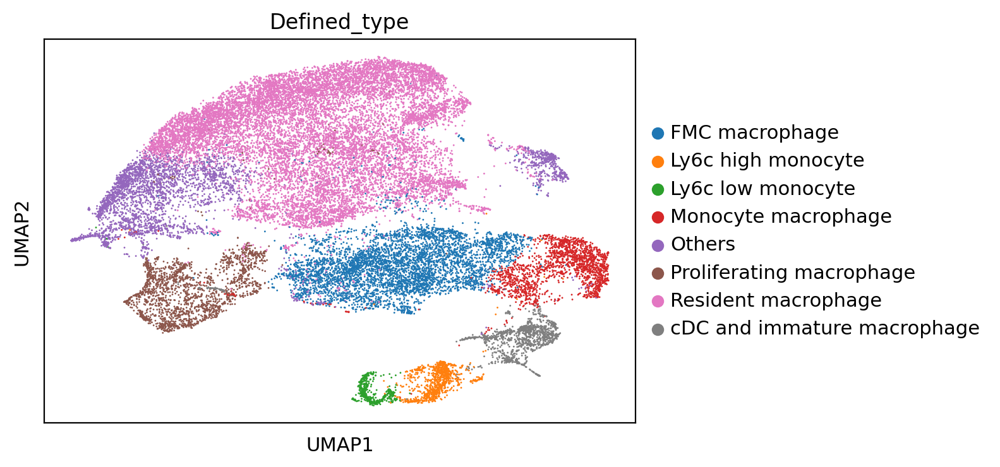

In [10]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20)
sc.tl.pca(adata)
# Reclustering
sc.pp.neighbors(adata, use_rep="X_scanorama")
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)
sc.tl.leiden(adata)
sc.tl.paga(adata, groups='leiden')
sc.pl.paga(adata,node_size_power= 1.0,threshold=0.1 ,layout ='rt',edge_width_scale = 0.1) 
sc.tl.umap(adata,  init_pos=sc.tl._utils.get_init_pos_from_paga(adata), maxiter=100, min_dist=0.1, spread= 4.0)
sc.pl.umap(adata, color='leiden', legend_loc='on data',legend_fontsize=10) 
sc.pl.umap(adata, color = 'Defined_type')

In [11]:
import cellrank as cr
scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [12]:
import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

recovering dynamics (using 4/384 cores)
    finished (0:00:18) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/384 cores)


  0%|          | 0/28823 [00:00<?, ?cells/s]

    finished (0:00:13) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:07) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


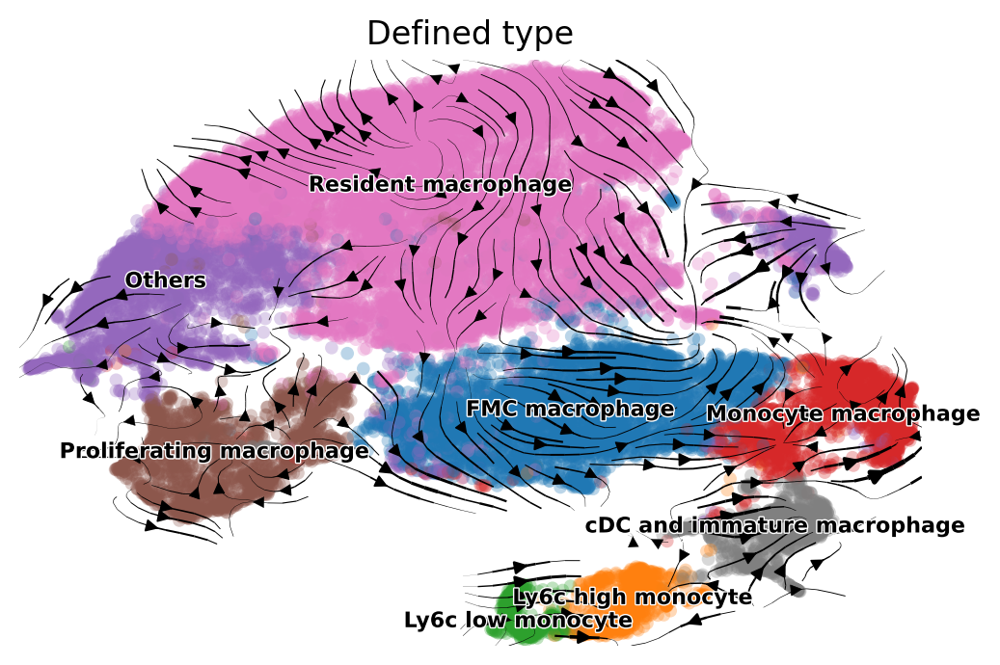

In [13]:
scv.tl.recover_dynamics(adata, n_jobs=4)
scv.tl.velocity(adata, mode="dynamical")

scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(
   adata, basis="umap", legend_fontsize=8, color ='Defined_type',smooth=0.8, min_mass=2
)
for c in adata.obs.select_dtypes(include=['category']).columns:
     adata.obs[c]=adata.obs[c].astype(str)

In [44]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


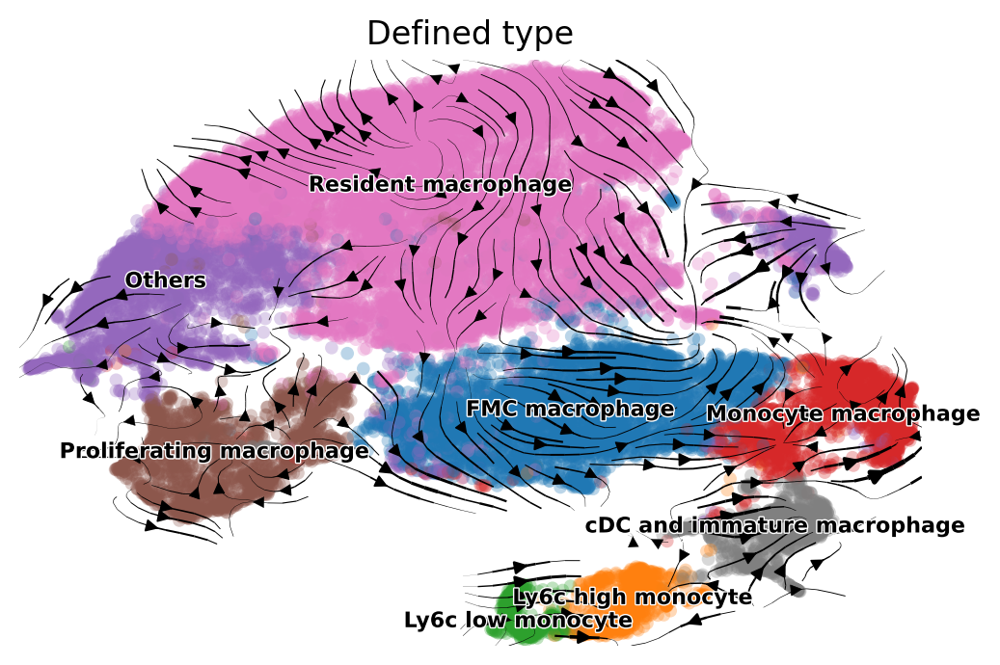

In [45]:
scv.pl.velocity_embedding_stream(
   adata, basis="umap", legend_fontsize=8, color ='Defined_type',smooth=0.8, min_mass=2
)

In [14]:
adata.write(out_path+'/mouse_subset_remove_blood.h5ad')


In [55]:

from pyBCS import scanpy2bcs
scanpy2bcs.format_data(out_path+'/mouse_subset_remove_blood.h5ad', out_path+'/mouse_subset_remove_blood.bcs',
                        input_format="h5ad", graph_based="leiden")


Writing main/metadata/metalist.json
Cannot convert Sample to numeric, treating as categorical
Cannot convert leiden to numeric, treating as categorical
Cannot convert Conditions to numeric, treating as categorical
Cannot convert Organ to numeric, treating as categorical
Cannot convert Cell_Type to numeric, treating as categorical
Cannot convert SatM_like to numeric, treating as categorical
Cannot convert phase to numeric, treating as categorical
Cannot convert clusters_gradients to numeric, treating as categorical
Cannot convert Defined_type to numeric, treating as categorical
Found graph based clustering in metadata with keyword leiden
Writing main/metadata/378f336199c7445d95c0397985677539.json
Writing main/metadata/d580d795ba7a41ceb41134e2a5a3e6f0.json
Writing main/metadata/778479923770406a80703779ea847af4.json
Writing main/metadata/43272fc7ea2f4054bf6cdb4437b30001.json
Writing main/metadata/8966abf3e1994b5aa49d6afe3bc77f4d.json
Writing main/metadata/7b5c7e23fada4b9d983878793b813637.

'/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq//mouse_subset_remove_blood.bcs'

In [15]:
cr.tl.terminal_states(adata, cluster_key='Defined_type', weight_connectivities=0.2,n_jobs=4,n_states=8)


Accessing `adata.obsp['T_fwd']`
Computing transition matrix based on logits using `'deterministic'` mode


/var/tmp/pbs.4095.idnfront2/ipykernel_2352096/3107776091.py:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata, cluster_key='Defined_type', weight_connectivities=0.2,n_jobs=4,n_states=8)
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/28823 [00:00<?, ?cell/s]

Setting `softmax_scale=1.8345`


  0%|          | 0/28823 [00:00<?, ?cell/s]

    Finish (0:00:08)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999567e-01 -1.1499034696617573e-03 1.7341370741904070e-03 -1.8697849216978978e-04 7.1069539118834837e-03 9.8183727590092011e-04 -3.4476994297489151e-03 3.1452265851650845e-03 1.9634371661294133e-03 
0.0000000000000000e+00 9.9478803098244284e-01 -1.1352273762697641e-04 1.2851833707408545e-03 2.3841946212481632e-03 2.0463375536969837e-04 -1.7167403651333086e-03 -8.8029021428885298e-04 -5.7080368504036976e-03 
0.0000000000000000e+00 0.0000000000000000e+00 9.9032352059791373e-01 -1.9209198762268603e-03 -2.0502966726360884e-03 7.9845025012542973e-05 2.1275403591654407e-03 -1.5011437152887398e-03 -1.0000112014130523e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.8596035664663551e-01 2.0744984083476961e-03 1.2778454622166286e

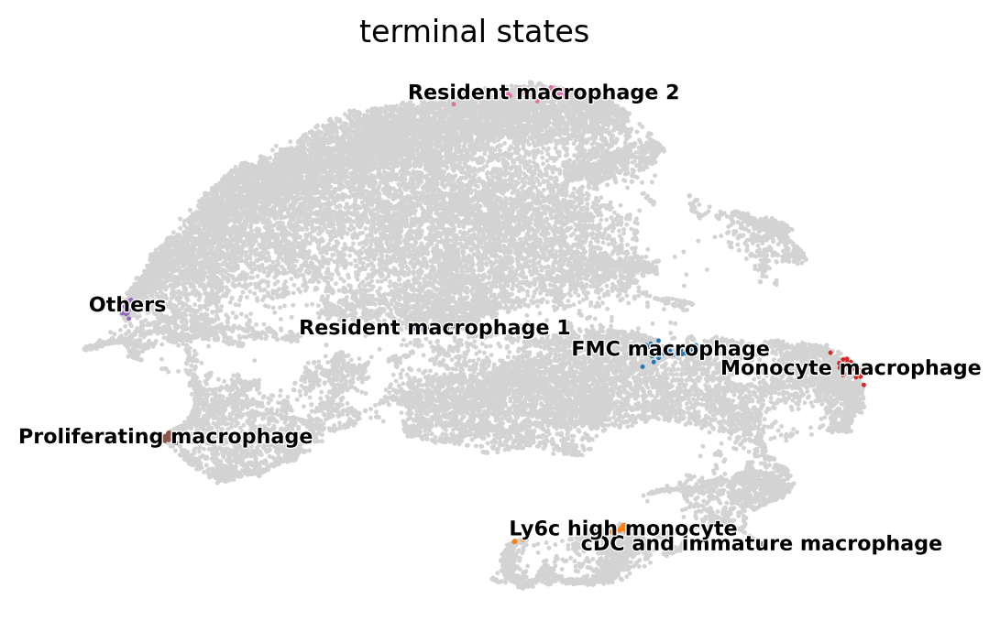

In [46]:
cr.pl.terminal_states(adata, discrete=True,legend_fontsize=8)

Accessing `adata.obsp['T_bwd']`
Computing transition matrix based on logits using `'deterministic'` mode


/var/tmp/pbs.4095.idnfront2/ipykernel_2352096/1505559493.py:1: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key='Defined_type',n_jobs=4,n_states=1)
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/28823 [00:00<?, ?cell/s]

Setting `softmax_scale=1.8345`


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind
[0]PETSC ERROR: or try http://valgrind.org on GNU/linux and Apple MacOS to find memory corruption errors
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


  0%|          | 0/28823 [00:00<?, ?cell/s]

    Finish (0:00:08)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind
[0]PETSC ERROR: or try http://valgrind.org on GNU/linux and Apple MacOS to find memory corruption errors
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:02)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


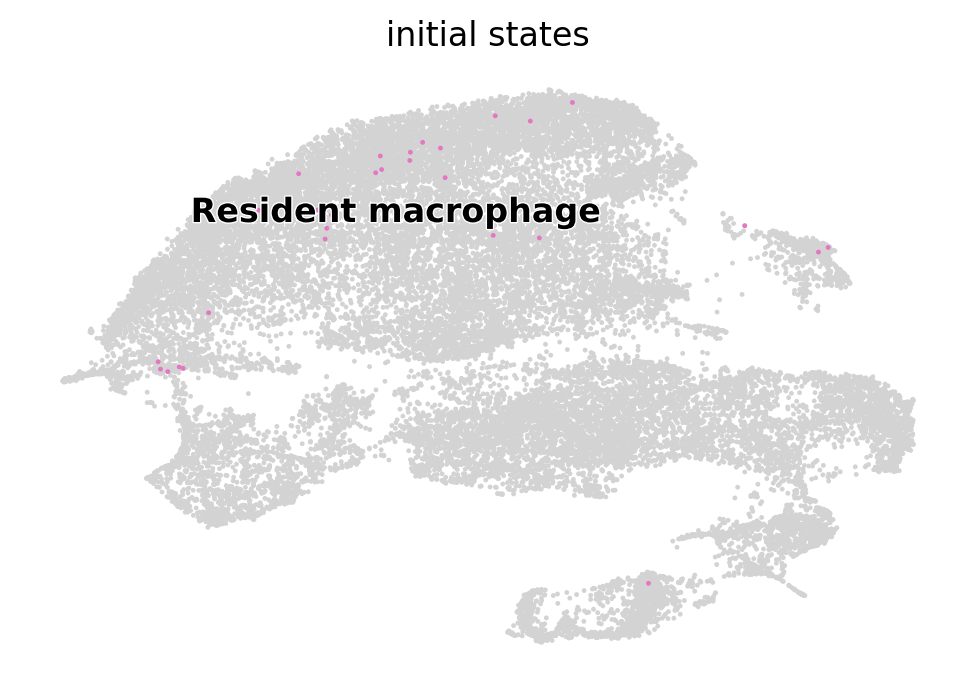

In [17]:
cr.tl.initial_states(adata, cluster_key='Defined_type',n_jobs=4,n_states=1)
cr.pl.initial_states(adata, discrete=True)

/var/tmp/pbs.4095.idnfront2/ipykernel_2352096/3086418465.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


Computing absorption probabilities


  0%|          | 0/8 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:03)


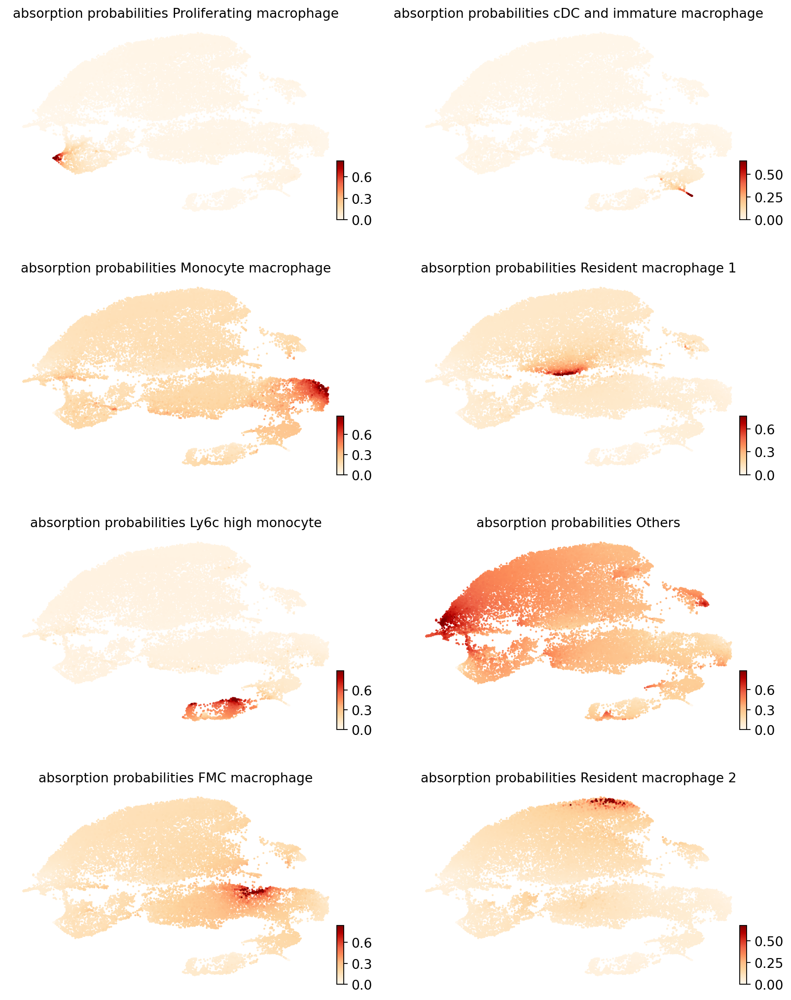

In [18]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False,ncols=2,cmap='OrRd')

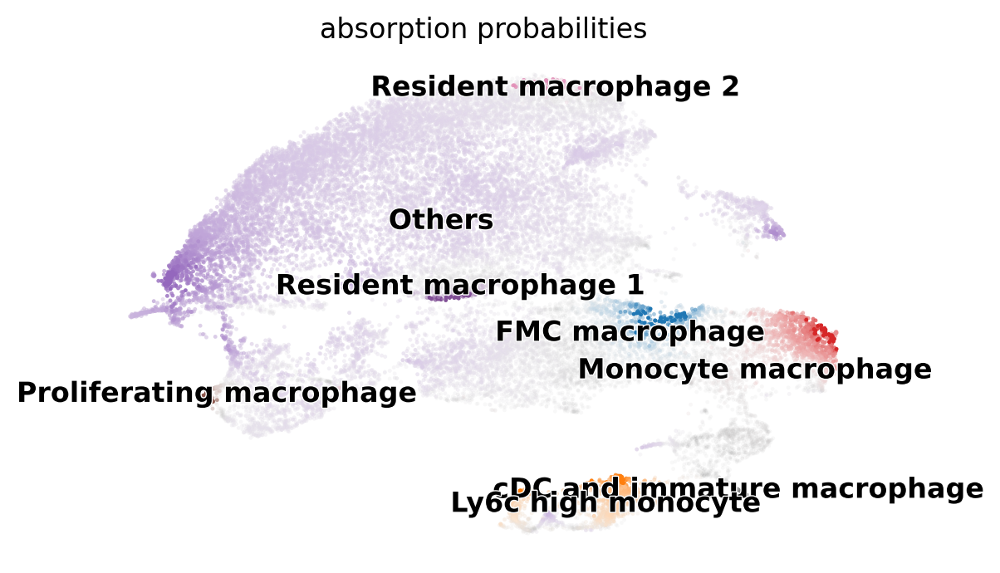

In [47]:
cr.pl.lineages(adata, discrete=True)

In [48]:
scv.tl.velocity_pseudotime(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

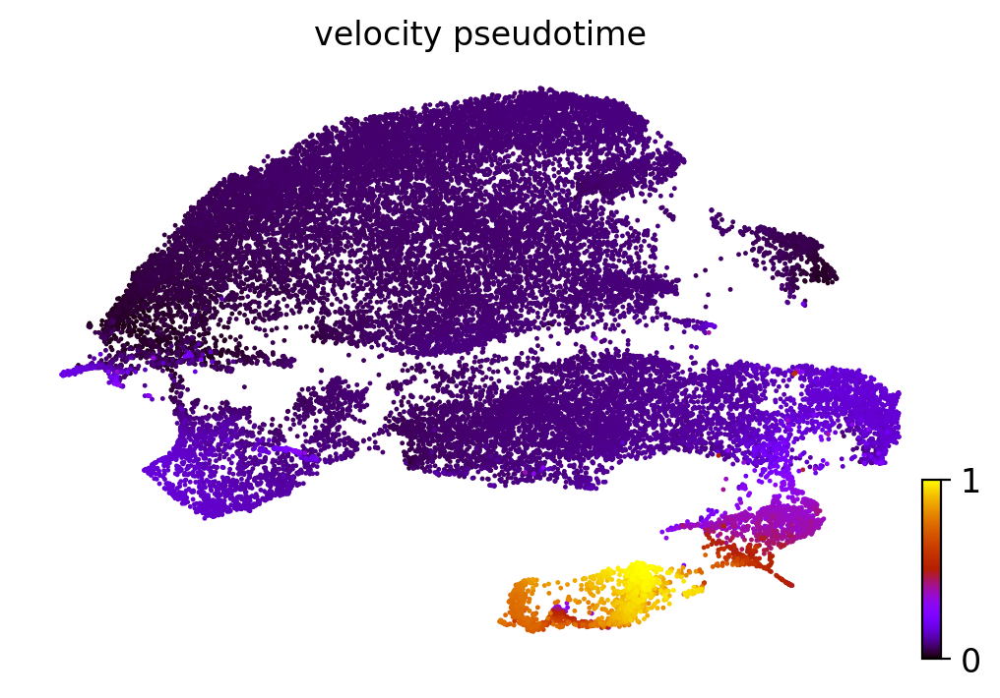

In [49]:
scv.pl.scatter(adata, color='velocity_pseudotime', color_map='gnuplot')

In [50]:
scv.tl.paga(
    adata,
    groups="Defined_type",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior='velocity_pseudotime',
)

running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:06) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/networkx/convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


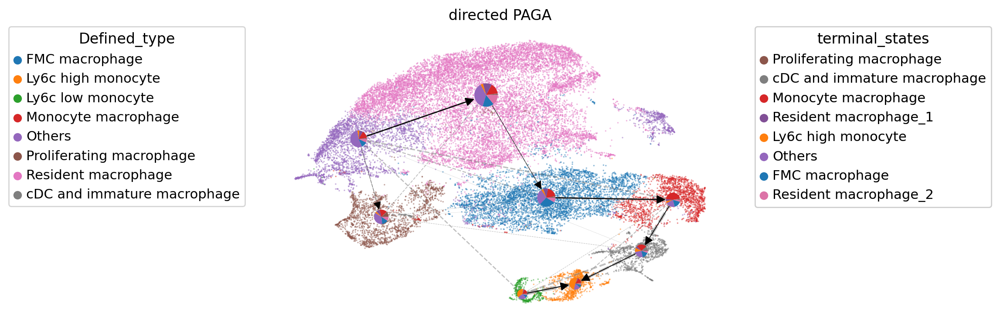

In [51]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="Defined_type",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=1,
    edge_width_scale=1,
    max_edge_width=3,
    title="directed PAGA",
)

In [52]:
scv.tl.paga(
    adata,
    groups="leiden",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:07) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/networkx/convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


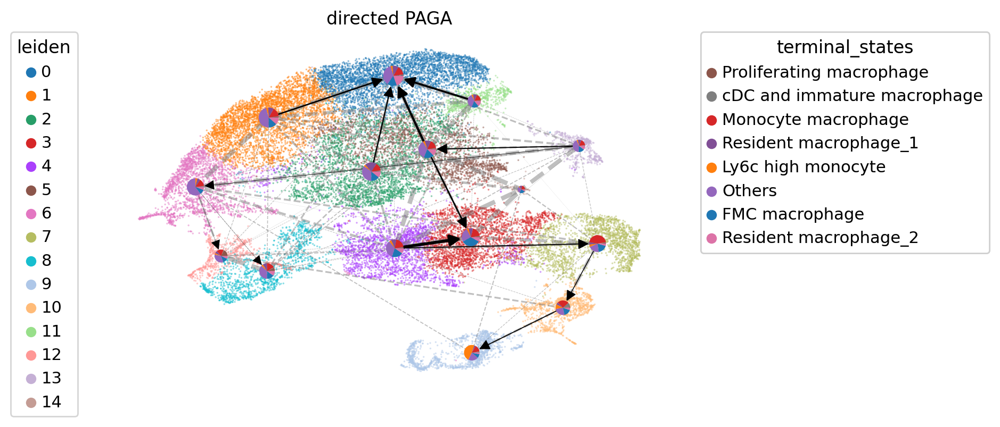

In [54]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="leiden",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=1,
    edge_width_scale=1,
    max_edge_width=3,
    title="directed PAGA",
)

In [33]:
cr.tl.lineage_drivers(adata)

/var/tmp/pbs.4095.idnfront2/ipykernel_2352096/1721556810.py:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,Proliferating macrophage_corr,Proliferating macrophage_pval,Proliferating macrophage_qval,Proliferating macrophage_ci_low,Proliferating macrophage_ci_high,cDC and immature macrophage_corr,cDC and immature macrophage_pval,cDC and immature macrophage_qval,cDC and immature macrophage_ci_low,cDC and immature macrophage_ci_high,...,FMC macrophage_corr,FMC macrophage_pval,FMC macrophage_qval,FMC macrophage_ci_low,FMC macrophage_ci_high,Resident macrophage_2_corr,Resident macrophage_2_pval,Resident macrophage_2_qval,Resident macrophage_2_ci_low,Resident macrophage_2_ci_high
PCLAF,0.406765,0.0,NaN,0.397085,0.416355,-0.001327,0.821736,NaN,-0.012872,0.010218,...,-0.084372,9.566083e-47,NaN,-0.095823,-0.072898,-0.089892,7.446296e-53,NaN,-0.101331,-0.078428
CDKN3,0.342747,0.0,NaN,0.332518,0.352895,-0.005974,0.310511,NaN,-0.017517,0.005571,...,-0.043276,1.962415e-13,NaN,-0.054793,-0.031747,-0.055105,7.646798e-21,NaN,-0.066608,-0.043588
KIF14,0.327693,0.0,NaN,0.317349,0.337959,-0.003320,0.573062,NaN,-0.014864,0.008225,...,-0.054625,1.654233e-20,NaN,-0.066128,-0.043107,-0.057100,2.896355e-22,NaN,-0.068599,-0.045585
SKA1,0.322249,0.0,NaN,0.311864,0.332556,-0.001673,0.776340,NaN,-0.013218,0.009871,...,-0.052820,2.825284e-19,NaN,-0.064325,-0.041301,-0.060999,3.453602e-25,NaN,-0.072493,-0.049489
PBK,0.280508,0.0,NaN,0.269837,0.291110,-0.001024,0.862017,NaN,-0.012568,0.010521,...,-0.055771,2.598288e-21,NaN,-0.067272,-0.044255,-0.062046,5.257680e-26,NaN,-0.073538,-0.050538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RIMKLA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BRINP2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PLA2G2C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TAFA4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
Terminals = adata.obs['terminal_states'].unique().tolist()

In [35]:
Terminals.remove(np.nan)

In [36]:

top_drivers = {}
for te in Terminals:
    top_drivers[te]=adata.varm['terminal_lineage_drivers'][te+"_corr"].sort_values(ascending=False).index[:200]
top_200 = pd.DataFrame(top_drivers)
top_200.to_csv(out_path+'/mouse_subset_drivers.csv')

In [37]:
top3_drivers = []
for te in Terminals:
    top3_drivers.extend(adata.varm['terminal_lineage_drivers'][te+"_corr"].sort_values(ascending=False).index[:1])


Computing trends using `1` core(s)


  0%|          | 0/7 [00:00<?, ?gene/s]

/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  (x < aug_knots[1:]).astype(np.int)
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If yo

/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

did not converge


/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

did not converge


/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/user/ifrec/liuyuchen/anaconda3/envs/scanpy_env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

    Finish (0:01:18)
Plotting trends


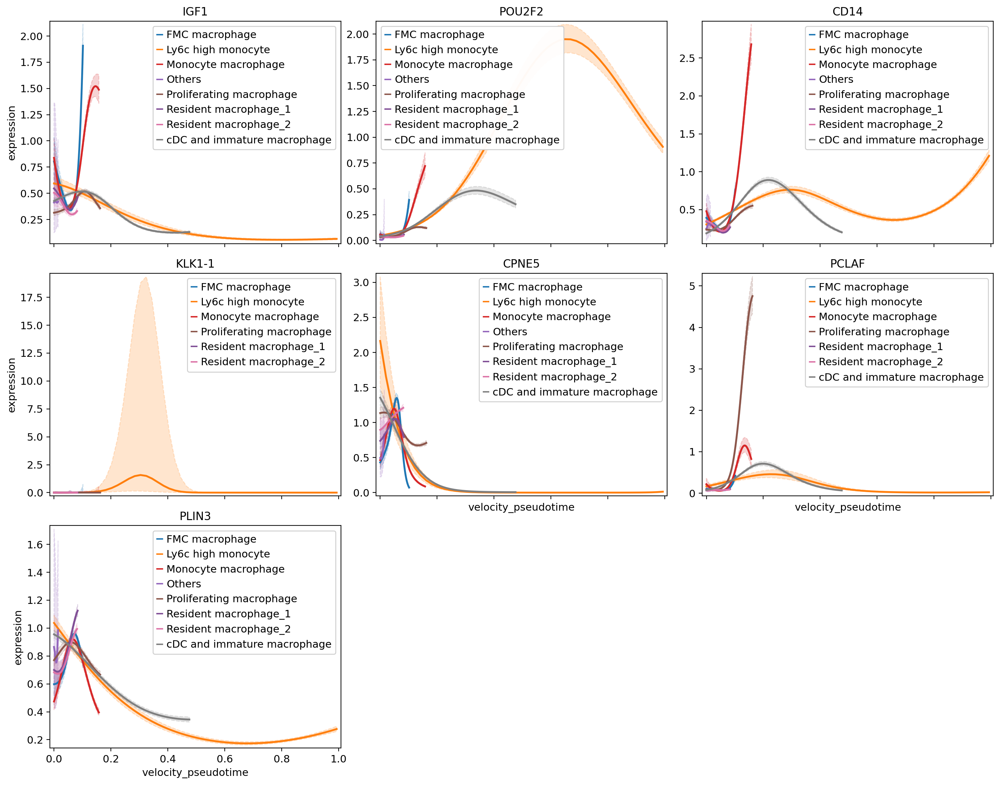

In [38]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=top3_drivers,
    ncols=3,
    time_key="velocity_pseudotime",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 12),
    n_test_points=50,
)